In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
import datetime
import time
from pyecharts.charts import Bar,Grid,Line,Pie
from pyecharts import options as opts
from pyecharts.globals import ThemeType
from pyecharts.commons.utils import JsCode

In [2]:
# 为了让pyecharts能在jupyter中render图像
from pyecharts.globals import CurrentConfig, NotebookType
CurrentConfig.NOTEBOOK_TYPE = NotebookType.JUPYTER_NOTEBOOK

## Step1: Merge the files

In [3]:
cab_df = pd.read_csv('DataSets/Cab_Data.csv')
city_df = pd.read_csv('DataSets/City.csv')
customer_df = pd.read_csv('DataSets/Customer_ID.csv')
trans_df = pd.read_csv('DataSets/Transaction_ID.csv')

In [4]:
all_df = pd.merge(trans_df, customer_df, left_on='Customer ID', right_on='Customer ID', how='left')
# 为了尽可能保证数据的完整性，使用left join
all_df = pd.merge(all_df, cab_df, left_on='Transaction ID', right_on='Transaction ID', how='left')
all_df = pd.merge(all_df, city_df, left_on='City', right_on='City', how='left')
all_df.head()

,Transaction ID,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Population,Users
0,10000011,29290,Card,Male,28,10813,42377.0,Pink Cab,ATLANTA GA,30.45,370.95,313.635,"814,885","24,701"
1,10000012,27703,Card,Male,27,9237,42375.0,Pink Cab,ATLANTA GA,28.62,358.52,334.854,"814,885","24,701"
2,10000013,28712,Cash,Male,53,11242,42371.0,Pink Cab,ATLANTA GA,9.04,125.20,97.632,"814,885","24,701"
3,10000014,28020,Cash,Male,23,23327,42376.0,Pink Cab,ATLANTA GA,33.17,377.40,351.602,"814,885","24,701"
4,10000015,27182,Card,Male,33,8536,42372.0,Pink Cab,ATLANTA GA,8.73,114.62,97.776,"814,885","24,701"


## Step2: Data Cleaning

In [5]:
all_df.shape

(440098, 14)

### 2.1 missing values (缺失值)

In [6]:
all_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 440098 entries, 0 to 440097
Data columns (total 14 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Transaction ID      440098 non-null  int64  
 1   Customer ID         440098 non-null  int64  
 2   Payment_Mode        440098 non-null  object 
 3   Gender              440098 non-null  object 
 4   Age                 440098 non-null  int64  
 5   Income (USD/Month)  440098 non-null  int64  
 6   Date of Travel      359392 non-null  float64
 7   Company             359392 non-null  object 
 8   City                359392 non-null  object 
 9   KM Travelled        359392 non-null  float64
 10  Price Charged       359392 non-null  float64
 11  Cost of Trip        359392 non-null  float64
 12  Population          359392 non-null  object 
 13  Users               359392 non-null  object 
dtypes: float64(4), int64(4), object(6)
memory usage: 50.4+ MB


As we can see, there is clearly missing data in the later columns.  

可以看出，后面几列数据明显有缺失。

In [7]:
trans_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440098 entries, 0 to 440097
Data columns (total 3 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   Transaction ID  440098 non-null  int64 
 1   Customer ID     440098 non-null  int64 
 2   Payment_Mode    440098 non-null  object
dtypes: int64(2), object(1)
memory usage: 10.1+ MB


In [8]:
cab_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359392 entries, 0 to 359391
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Transaction ID  359392 non-null  int64  
 1   Date of Travel  359392 non-null  int64  
 2   Company         359392 non-null  object 
 3   City            359392 non-null  object 
 4   KM Travelled    359392 non-null  float64
 5   Price Charged   359392 non-null  float64
 6   Cost of Trip    359392 non-null  float64
dtypes: float64(3), int64(2), object(2)
memory usage: 19.2+ MB


Comparing each data file, we can find that the data file with most detailed information is Cab_Data, which contains the companies for each transaction, i.e., Yellow Cab and Pink Cab.   
However, the number of transaction records in Cab_Data is less than the number of transaction records in Transaction_ID, which leads to missing data after merging the data files.   
Since we want to analyze which is better for Yellow Cab and Pink Cab, and these missing transaction records are not able to determine which company they correspond to, we can choose to drop these missing data. 

对比各个数据文件可以发现，信息最详细的数据文件是Cab_Data，里面包含了每一个交易所对于的公司，也就是yellow cab和pink cab。但是Cab_Data的交易记录数量少于Transaction_ID中的交易数量，这才导致合并数据文件后，存在数据缺失。  
由于我们要分析的是yellow和pink孰优孰劣，这些缺失的交易记录又无法判断是对应哪家公司，所以可以选择drop缺失值。

In [9]:
all_df.dropna(inplace=True)
all_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 359392 entries, 0 to 440096
Data columns (total 14 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Transaction ID      359392 non-null  int64  
 1   Customer ID         359392 non-null  int64  
 2   Payment_Mode        359392 non-null  object 
 3   Gender              359392 non-null  object 
 4   Age                 359392 non-null  int64  
 5   Income (USD/Month)  359392 non-null  int64  
 6   Date of Travel      359392 non-null  float64
 7   Company             359392 non-null  object 
 8   City                359392 non-null  object 
 9   KM Travelled        359392 non-null  float64
 10  Price Charged       359392 non-null  float64
 11  Cost of Trip        359392 non-null  float64
 12  Population          359392 non-null  object 
 13  Users               359392 non-null  object 
dtypes: float64(4), int64(4), object(6)
memory usage: 41.1+ MB


### 2.2 duplicate values (重复值)

In [10]:
all_df.drop_duplicates(inplace=True)
all_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 359392 entries, 0 to 440096
Data columns (total 14 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Transaction ID      359392 non-null  int64  
 1   Customer ID         359392 non-null  int64  
 2   Payment_Mode        359392 non-null  object 
 3   Gender              359392 non-null  object 
 4   Age                 359392 non-null  int64  
 5   Income (USD/Month)  359392 non-null  int64  
 6   Date of Travel      359392 non-null  float64
 7   Company             359392 non-null  object 
 8   City                359392 non-null  object 
 9   KM Travelled        359392 non-null  float64
 10  Price Charged       359392 non-null  float64
 11  Cost of Trip        359392 non-null  float64
 12  Population          359392 non-null  object 
 13  Users               359392 non-null  object 
dtypes: float64(4), int64(4), object(6)
memory usage: 41.1+ MB


We can find that the amount of data does not change after the de-duplication operation, indicating that there are no duplicate values. 

可以发现，去重操作前后，数据量没有变化，说明没有重复值

### 2.3 Outliers (异常值)

In [11]:
all_df['Transaction ID'].duplicated().sum()

0

A result of 0 can indicate that the Transaction ID is not repeated, which makes sense. 

结果为0说明Transaction ID没有重复，是正确的

In [12]:
all_df.describe()

,Transaction ID,Customer ID,Age,Income (USD/Month),Date of Travel,KM Travelled,Price Charged,Cost of Trip
count,3.593920e+05,359392.000000,359392.000000,359392.000000,359392.000000,359392.000000,359392.000000,359392.000000
mean,1.022076e+07,19191.652115,35.336705,15048.822937,42964.067998,22.567254,423.443311,286.190113
std,1.268058e+05,21012.412463,12.594234,7969.409482,307.467197,12.233526,274.378911,157.993661
min,1.000001e+07,1.000000,18.000000,2000.000000,42371.000000,1.900000,15.600000,19.000000
25%,1.011081e+07,2705.000000,25.000000,8424.000000,42697.000000,12.000000,206.437500,151.200000
50%,1.022104e+07,7459.000000,33.000000,14685.000000,42988.000000,22.440000,386.360000,282.480000
75%,1.033094e+07,36078.000000,42.000000,21035.000000,43232.000000,32.960000,583.660000,413.683200
max,1.044011e+07,60000.000000,65.000000,35000.000000,43465.000000,48.000000,2048.030000,691.200000


- Age的最小值18岁，最大值65岁，正常
- income看起来也比较正常
- Date of travel是excel的格式，需要改
- travel的km数还算正常
- price的最大值2000多美元，有点贵，但是在此我们认为可以接受
- 成本看起来也还正常

In [13]:
# 将excel的时间戳转为日期
# 注意：excel时间戳和python中默认的时间戳，计算方式不同，所以不能直接用datatime模块
# http://t.zoukankan.com/jingzaixin-p-13447942.html
# https://cloud.tencent.com/developer/article/1724244

a = '42377'
import pandas as pd
def convert_excel_date(stamp):
    delta = pd.Timedelta(str(stamp)+'D')
    real_time = pd.to_datetime('1899-12-30') + delta
    return real_time

print(type(convert_excel_date(a)))
print(convert_excel_date(a))

<class 'pandas._libs.tslibs.timestamps.Timestamp'>
2016-01-08 00:00:00


In [14]:
all_df['Date'] = all_df['Date of Travel'].apply(convert_excel_date).dt.date
all_df.drop(columns='Date of Travel', inplace=True)

In [15]:
all_df.head()

,Transaction ID,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),Company,City,KM Travelled,Price Charged,Cost of Trip,Population,Users,Date
0,10000011,29290,Card,Male,28,10813,Pink Cab,ATLANTA GA,30.45,370.95,313.635,"814,885","24,701",2016-01-08
1,10000012,27703,Card,Male,27,9237,Pink Cab,ATLANTA GA,28.62,358.52,334.854,"814,885","24,701",2016-01-06
2,10000013,28712,Cash,Male,53,11242,Pink Cab,ATLANTA GA,9.04,125.20,97.632,"814,885","24,701",2016-01-02
3,10000014,28020,Cash,Male,23,23327,Pink Cab,ATLANTA GA,33.17,377.40,351.602,"814,885","24,701",2016-01-07
4,10000015,27182,Card,Male,33,8536,Pink Cab,ATLANTA GA,8.73,114.62,97.776,"814,885","24,701",2016-01-03


## Step3: Data Visualization (可视化)

### 3.1 profitability comparison (盈利情况对比)

#### 3.1.1 profit of per km comparison(每千米的盈利对比)

In [16]:
# Profit per KM
all_df['ave_profit_km'] = (all_df['Price Charged'] - all_df['Cost of Trip']) / all_df['KM Travelled']

In [17]:
all_df[all_df['ave_profit_km'] <= 0]  ## 有利润小于0的

,Transaction ID,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),Company,City,KM Travelled,Price Charged,Cost of Trip,Population,Users,Date,ave_profit_km
53,10000064,25949,Card,Male,32,31491,Pink Cab,DALLAS TX,9.45,73.43,98.2800,"942,908","22,157",2016-01-06,-2.629630
54,10000065,24086,Card,Male,60,19410,Pink Cab,DALLAS TX,4.90,35.76,49.4900,"942,908","22,157",2016-01-11,-2.802041
55,10000066,25155,Card,Male,27,10997,Pink Cab,DALLAS TX,13.13,122.42,149.6820,"942,908","22,157",2016-01-02,-2.076314
56,10000067,25247,Cash,Male,26,24178,Pink Cab,DALLAS TX,33.32,308.58,386.5120,"942,908","22,157",2016-01-02,-2.338896
57,10000068,24530,Cash,Male,47,10312,Pink Cab,DALLAS TX,4.52,38.31,52.8840,"942,908","22,157",2016-01-11,-3.224336
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
440047,10440058,52288,Cash,Male,64,14903,Yellow Cab,WASHINGTON DC,32.70,442.83,443.4120,"418,859","127,001",2018-01-05,-0.017798
440065,10440076,53475,Card,Female,36,18038,Yellow Cab,WASHINGTON DC,8.19,113.32,114.9876,"418,859","127,001",2018-01-07,-0.203614
440069,10440080,53147,Card,Male,22,11254,Yellow Cab,WASHINGTON DC,5.55,78.43,78.5880,"418,859","127,001",2018-01-07,-0.028468
440076,10440087,52010,Card,Male,19,23602,Yellow Cab,WASHINGTON DC,47.20,653.09,668.3520,"418,859","127,001",2018-01-06,-0.323347


In [18]:
all_df[all_df['ave_profit_km'] <= 0].groupby(['Company']).count()

,Transaction ID,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),City,KM Travelled,Price Charged,Cost of Trip,Population,Users,Date,ave_profit_km
Company,,,,,,,,,,,,,,
Pink Cab,11131,11131,11131,11131,11131,11131,11131,11131,11131,11131,11131,11131,11131,11131
Yellow Cab,13692,13692,13692,13692,13692,13692,13692,13692,13692,13692,13692,13692,13692,13692


Both companies have transactions with profits less than 0.

可以看出，两家公司都有利润小于0的交易

In [19]:
all_df['Year'] = all_df['Date'].apply(lambda x: str(x)[0:4])  # 提取出年份
all_df.head()

,Transaction ID,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),Company,City,KM Travelled,Price Charged,Cost of Trip,Population,Users,Date,ave_profit_km,Year
0,10000011,29290,Card,Male,28,10813,Pink Cab,ATLANTA GA,30.45,370.95,313.635,"814,885","24,701",2016-01-08,1.882266,2016
1,10000012,27703,Card,Male,27,9237,Pink Cab,ATLANTA GA,28.62,358.52,334.854,"814,885","24,701",2016-01-06,0.826904,2016
2,10000013,28712,Cash,Male,53,11242,Pink Cab,ATLANTA GA,9.04,125.20,97.632,"814,885","24,701",2016-01-02,3.049558,2016
3,10000014,28020,Cash,Male,23,23327,Pink Cab,ATLANTA GA,33.17,377.40,351.602,"814,885","24,701",2016-01-07,0.777751,2016
4,10000015,27182,Card,Male,33,8536,Pink Cab,ATLANTA GA,8.73,114.62,97.776,"814,885","24,701",2016-01-03,1.929439,2016


In [20]:
profit_km_year = all_df.groupby(['Year', 'Company'])['ave_profit_km'].mean()
profit_km_year.index.get_level_values('Year')
profit_km_year = profit_km_year.reset_index()
profit_km_year

,Year,Company,ave_profit_km
0,2016,Pink Cab,3.026813
1,2016,Yellow Cab,7.489847
2,2017,Pink Cab,2.962883
3,2017,Yellow Cab,7.494612
4,2018,Pink Cab,2.350447
5,2018,Yellow Cab,6.364805


In [21]:
fig_profit_km_year = (
    Bar(init_opts=opts.InitOpts(theme=ThemeType.HALLOWEEN))
    .add_xaxis(['2016', '2017', '2018'])
    .add_yaxis('Pink Cab', np.round(profit_km_year[profit_km_year['Company'] == 'Pink Cab']['ave_profit_km'], 2).tolist())
    .add_yaxis('Yellow Cab', np.round(profit_km_year[profit_km_year['Company'] == 'Yellow Cab']['ave_profit_km'], 2).tolist())
    .set_series_opts(
        label_opts=opts.LabelOpts(position='inside')
    )
    .set_global_opts(
        title_opts=opts.TitleOpts(title='Average Profit Per KM')
        , xaxis_opts=opts.AxisOpts(name='Year')
        , yaxis_opts=opts.AxisOpts(name='Average Profit Per KM')
    )
)
# fig_profit_km_year.load_javascript()
fig_profit_km_year.render_notebook()

The profitability per km of Yellow Cab is much greater than that of Pink Cab

可以看出，yellow cab的每千米盈利能力远大于pink cab

In [22]:
# F1: 用agg实现
all_df.groupby(['Year', 'Company']).aggregate({'ave_profit_km': lambda x: (x>0).sum() / x.count()})

ave_profit_km
Year Company                  
2016 Pink Cab         0.870774
     Yellow Cab       0.952735
2017 Pink Cab         0.856106
     Yellow Cab       0.948110
2018 Pink Cab         0.879666
     Yellow Cab       0.950028

In [23]:
# F2：用apply实现
all_df.groupby(['Year', 'Company'])['ave_profit_km'].apply(lambda x: (x>0).sum() / x.count())

Year  Company   
2016  Pink Cab      0.870774
      Yellow Cab    0.952735
2017  Pink Cab      0.856106
      Yellow Cab    0.948110
2018  Pink Cab      0.879666
      Yellow Cab    0.950028
Name: ave_profit_km, dtype: float64

In [24]:
pos_profit_p = all_df.groupby(['Year', 'Company'])['ave_profit_km'].apply(lambda x: (x>0).sum() / x.count())
pos_profit_p = pos_profit_p.reset_index()
pos_profit_p

,Year,Company,ave_profit_km
0,2016,Pink Cab,0.870774
1,2016,Yellow Cab,0.952735
2,2017,Pink Cab,0.856106
3,2017,Yellow Cab,0.948110
4,2018,Pink Cab,0.879666
5,2018,Yellow Cab,0.950028


In [25]:
fig_pos_profit_p = (
    Bar(init_opts=opts.InitOpts(theme=ThemeType.HALLOWEEN))
    .add_xaxis(sorted(pos_profit_p['Year'].unique().tolist()))
    .add_yaxis('Pink Cab', np.round(pos_profit_p[pos_profit_p['Company'] == 'Pink Cab']['ave_profit_km'], 4).tolist())
    .add_yaxis('Yellow Cab', np.round(pos_profit_p[pos_profit_p['Company'] == 'Yellow Cab']['ave_profit_km'], 4).tolist())
    .set_series_opts(
        label_opts=opts.LabelOpts(
            position='inside'
            , formatter=JsCode(
                "function(x){return Number(x.data * 100).toFixed(2) + '%';}"
            )
        )
    )
    .set_global_opts(
        title_opts=opts.TitleOpts(title='Proportion of positive Profit')
        , xaxis_opts=opts.AxisOpts(name='Year')
        , yaxis_opts=opts.AxisOpts(name='Proportion')
    )
)
fig_pos_profit_p.render_notebook()

The percentage of profitable transactions for Yellow Cab is also larger than that of Pink Cab.

可以看出，yellow cab的盈利的比例也大于pink cab

In [26]:
pos_profit_city_pink = all_df[all_df['Company'] == 'Pink Cab'].groupby(['City'])['ave_profit_km'].apply(lambda x: (x>0).sum() / x.count())
pos_profit_city_pink = pos_profit_city_pink.reset_index()
pos_profit_city_pink

,City,ave_profit_km
0,ATLANTA GA,0.842792
1,AUSTIN TX,0.920236
2,BOSTON MA,0.858465
3,CHICAGO IL,0.764341
4,DALLAS TX,0.607971
5,DENVER CO,0.664275
6,LOS ANGELES CA,0.880946
7,MIAMI FL,0.863636
8,NASHVILLE TN,0.701249
9,NEW YORK NY,0.967495


In [27]:
pos_profit_city_yellow = all_df[all_df['Company'] == 'Yellow Cab'].groupby(['City'])['ave_profit_km'].apply(lambda x: (x>0).sum() / x.count())
pos_profit_city_yellow = pos_profit_city_yellow.reset_index()
pos_profit_city_yellow

,City,ave_profit_km
0,ATLANTA GA,0.985160
1,AUSTIN TX,0.969947
2,BOSTON MA,0.877010
3,CHICAGO IL,0.879549
4,DALLAS TX,0.999823
5,DENVER CO,0.987248
6,LOS ANGELES CA,0.976463
7,MIAMI FL,0.985400
8,NASHVILLE TN,0.877673
9,NEW YORK NY,1.000000


In [28]:
fig_pos_profit_city = (
    Bar(init_opts=opts.InitOpts(theme=ThemeType.HALLOWEEN, width='2100px', height='850px'))
    .add_xaxis(pos_profit_city_pink['City'].tolist())
    .add_yaxis('Pink Cab', pos_profit_city_pink['ave_profit_km'].tolist(), category_gap='80%', gap='20%', bar_width='30')
    .add_yaxis('Yellow Cab', pos_profit_city_yellow['ave_profit_km'].tolist(), category_gap='80%',gap='20%', bar_width='30')
    .set_series_opts(
        label_opts=opts.LabelOpts(
            position='inside'
            , formatter=JsCode(
                "function(x){return Number(x.data * 100).toFixed(2) + '%';}"
            )
        )
    )
    .set_global_opts(
        title_opts=opts.TitleOpts(title='Citywise Profitable rides Percentage')
        , xaxis_opts=opts.AxisOpts(name='City', axislabel_opts={'rotate': 20})
        , yaxis_opts=opts.AxisOpts(name='Percentage')
    )
)
fig_pos_profit_city.render_notebook()

In all but one city, the proportion of profitable transactions for Yellow Cab is greater than that of Pink Cab.

可以发现，除了一个城市外，在其他城市，yellow cab的盈利比例都大于pink cab

#### 3.1.2 Total Profit (总盈利水平)

In [29]:
all_df['Profit'] = all_df['Price Charged'] - all_df['Cost of Trip']
all_df.head()

,Transaction ID,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),Company,City,KM Travelled,Price Charged,Cost of Trip,Population,Users,Date,ave_profit_km,Year,Profit
0,10000011,29290,Card,Male,28,10813,Pink Cab,ATLANTA GA,30.45,370.95,313.635,"814,885","24,701",2016-01-08,1.882266,2016,57.315
1,10000012,27703,Card,Male,27,9237,Pink Cab,ATLANTA GA,28.62,358.52,334.854,"814,885","24,701",2016-01-06,0.826904,2016,23.666
2,10000013,28712,Cash,Male,53,11242,Pink Cab,ATLANTA GA,9.04,125.20,97.632,"814,885","24,701",2016-01-02,3.049558,2016,27.568
3,10000014,28020,Cash,Male,23,23327,Pink Cab,ATLANTA GA,33.17,377.40,351.602,"814,885","24,701",2016-01-07,0.777751,2016,25.798
4,10000015,27182,Card,Male,33,8536,Pink Cab,ATLANTA GA,8.73,114.62,97.776,"814,885","24,701",2016-01-03,1.929439,2016,16.844


In [30]:
total_profit_pink = all_df[all_df['Company'] == 'Pink Cab'].groupby(['Year'])['Profit'].sum()
total_profit_pink.apply(lambda x: format(int(x), ','))  # 数字设置千分位
total_profit_pink

Year
2016    1713511.224
2017    2033654.908
2018    1560162.189
Name: Profit, dtype: float64

In [31]:
total_profit_yellow = all_df[all_df['Company'] == 'Yellow Cab'].groupby(['Year'])['Profit'].sum()
total_profit_yellow.apply(lambda x: format(int(x), ','))
total_profit_yellow

Year
2016    1.392700e+07
2017    1.657598e+07
2018    1.351740e+07
Name: Profit, dtype: float64

In [32]:
fig_total_profit = (
    Line(init_opts=opts.InitOpts(theme=ThemeType.HALLOWEEN))
    .add_xaxis(['2016', '2017', '2018'])
    .add_yaxis(
        series_name='Pink Cab'
        , y_axis=np.round(total_profit_pink).tolist()
    )
    .add_yaxis(
        series_name='Yellow Cab'
        , y_axis=np.round(total_profit_yellow).tolist()
    )
    .set_series_opts(
        label_opts=opts.LabelOpts(
            formatter=JsCode(
                '''
                function(params){
                    let num = String(params.data[1]),
                        temp_list = [];
                    for(let i=num.length-1, j=1; i>=0; i--, j++){
                        temp_list.push(num[i]);
                        if(j%3==0 && i!=0){
                            temp_list.push(',')
                        }
                    }
                    return temp_list.reverse().join('');
                }
                '''
                # 注意：如果只按照收藏的教程，会把年份也加上逗号
                # 所以，参数中用para.data[1]，只取y轴的数据
            )
        )
    )
    .set_global_opts(
        title_opts=opts.TitleOpts(title='Yearly total profit')
        , xaxis_opts=opts.AxisOpts(name='Year')
        , yaxis_opts=opts.AxisOpts(name='Profit')
    )
)
fig_total_profit.render_notebook()

As we can see, the total profit of Yellow Cab is much larger than that of Pink Cab.

可以看出，yellow cab的总盈利远大于pink cab

### 3.2 User Analysis (用户分析)

#### 3.2.1 User level by income (按收入划分用户)

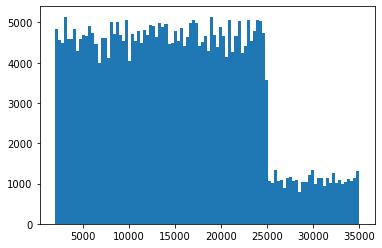

In [33]:
plt.hist(all_df['Income (USD/Month)'], bins=100)
plt.show()

假设数据中的income指的是家庭月收入，根据usnews，分成5个阶级
https://money.usnews.com/money/personal-finance/family-finance/articles/where-do-i-fall-in-the-american-economic-class-system

In [34]:
def class_level(x):
    if x * 12 >= 373894:
        return 'rich'
    elif x * 12 >= 106827:
        return 'upper-middle'
    elif x * 12 >= 53413:
        return 'middle'
    elif x * 12 >= 32048:
        return 'lower-middle'
    else:
        return 'poor'

In [35]:
all_df['Class'] = all_df['Income (USD/Month)'].apply(class_level)
all_df.head()

,Transaction ID,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),Company,City,KM Travelled,Price Charged,Cost of Trip,Population,Users,Date,ave_profit_km,Year,Profit,Class
0,10000011,29290,Card,Male,28,10813,Pink Cab,ATLANTA GA,30.45,370.95,313.635,"814,885","24,701",2016-01-08,1.882266,2016,57.315,upper-middle
1,10000012,27703,Card,Male,27,9237,Pink Cab,ATLANTA GA,28.62,358.52,334.854,"814,885","24,701",2016-01-06,0.826904,2016,23.666,upper-middle
2,10000013,28712,Cash,Male,53,11242,Pink Cab,ATLANTA GA,9.04,125.20,97.632,"814,885","24,701",2016-01-02,3.049558,2016,27.568,upper-middle
3,10000014,28020,Cash,Male,23,23327,Pink Cab,ATLANTA GA,33.17,377.40,351.602,"814,885","24,701",2016-01-07,0.777751,2016,25.798,upper-middle
4,10000015,27182,Card,Male,33,8536,Pink Cab,ATLANTA GA,8.73,114.62,97.776,"814,885","24,701",2016-01-03,1.929439,2016,16.844,middle


In [36]:
class_pink = all_df[all_df['Company'] == 'Pink Cab'].groupby(['Class']).count()
class_yellow = all_df[all_df['Company'] == 'Yellow Cab'].groupby(['Class']).count()
class_yellow = class_yellow.reset_index()
class_pink = class_pink.reset_index()

In [37]:
cats = ['poor', 'lower-middle', 'middle', 'upper-middle', 'rich']
class_pink['Class'] = pd.Categorical(class_pink['Class'], categories=cats, ordered=True)
class_pink.sort_values(['Class'], inplace=True)
class_pink.reset_index(drop=True)

class_yellow['Class'] = pd.Categorical(class_yellow['Class'], categories=cats, ordered=True)
class_yellow.sort_values(['Class'], inplace=True)
class_yellow.reset_index(drop=True)

,Class,Transaction ID,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),Company,City,KM Travelled,Price Charged,Cost of Trip,Population,Users,Date,ave_profit_km,Year,Profit
0,poor,7258,7258,7258,7258,7258,7258,7258,7258,7258,7258,7258,7258,7258,7258,7258,7258,7258
1,lower-middle,19545,19545,19545,19545,19545,19545,19545,19545,19545,19545,19545,19545,19545,19545,19545,19545,19545
2,middle,47278,47278,47278,47278,47278,47278,47278,47278,47278,47278,47278,47278,47278,47278,47278,47278,47278
3,upper-middle,190898,190898,190898,190898,190898,190898,190898,190898,190898,190898,190898,190898,190898,190898,190898,190898,190898
4,rich,9702,9702,9702,9702,9702,9702,9702,9702,9702,9702,9702,9702,9702,9702,9702,9702,9702


In [38]:
fig_class = (
    Bar(init_opts=opts.InitOpts(theme=ThemeType.HALLOWEEN))
    .add_xaxis(cats)
    .add_yaxis('Pink Cab', class_pink['Transaction ID'].tolist())
    .add_yaxis('Yellow Cab', class_yellow['Transaction ID'].tolist())
    .set_series_opts(
        label_opts=opts.LabelOpts(position='inside')
    )
    .set_global_opts(
        title_opts=opts.TitleOpts(title='Income Class wise customer base Analysis')
        , legend_opts=opts.LegendOpts(pos_top=30)
        , xaxis_opts=opts.AxisOpts(name='Class')
        , yaxis_opts=opts.AxisOpts(name='count')
    )
)
fig_class.render_notebook()

For users of all income levels, the profit of Yellow Cab is greater than that of Pink Cab

可以看出，对于所有收入等级的用户，yellow cab的盈利都大于pink cab

In [39]:
fig_class_proportion_yellow = (
    Pie(init_opts=opts.InitOpts(theme=ThemeType.HALLOWEEN))
    .add(
        ""
        , [list(z) for z in zip(cats, class_yellow['Transaction ID'].tolist())]
        , radius=['40%', '75%']
    )
    .set_global_opts(
        title_opts=opts.TitleOpts(title='The proportion of profits contributed by different classes (Yellow Cab)')
        , legend_opts=opts.LegendOpts(orient='vertical', pos_top='15%', pos_left='2%')
    )
    .set_series_opts(
        label_opts=opts.LabelOpts(formatter='{b}: {c}')
    )
)
fig_class_proportion_yellow.render_notebook()

In [40]:
fig_class_proportion_yellow = (
    Pie(init_opts=opts.InitOpts(theme=ThemeType.HALLOWEEN))
    .add(
        ""
        , [list(z) for z in zip(cats, class_pink['Transaction ID'].tolist())]
        , radius=['40%', '75%']
    )
    .set_global_opts(
        title_opts=opts.TitleOpts(title='The proportion of profits contributed by different classes (Pink Cab)')
        , legend_opts=opts.LegendOpts(orient='vertical', pos_top='15%', pos_left='2%')
    )
    .set_series_opts(
        label_opts=opts.LabelOpts(formatter='{b}: {c}')
    )
)
fig_class_proportion_yellow.render_notebook()

The middle class and upper-middle class contribute to the vast majority of transactions for both Yellow Cab and Pink Cab. Therefore, these customers should be the focus of the company's attention. 

可以看出，不管是对于yellow cab还是yellow cab，middle class和upper-middle class贡献了绝大多数交易，因此，这部分客户对公司来说应该重点关注

In [41]:
class_pink_ave_profit = all_df[all_df['Company'] == 'Pink Cab'].groupby(['Class'])['Profit'].mean().reset_index()
class_yellow_ave_profit = all_df[all_df['Company'] == 'Yellow Cab'].groupby(['Class'])['Profit'].mean().reset_index()

class_pink_ave_profit['Class'] = pd.Categorical(class_pink_ave_profit['Class'], categories=cats, ordered=True)
class_pink_ave_profit.sort_values(['Class'], inplace=True)
class_pink_ave_profit.reset_index(drop=True)

class_yellow_ave_profit['Class'] = pd.Categorical(class_yellow_ave_profit['Class'], categories=cats, ordered=True)
class_yellow_ave_profit.sort_values(['Class'], inplace=True)
class_yellow_ave_profit.reset_index(drop=True)

,Class,Profit
0,poor,158.365725
1,lower-middle,159.356224
2,middle,156.839487
3,upper-middle,161.545331
4,rich,154.875224


In [42]:
fig_class_ave_profit = (
    Bar(init_opts=opts.InitOpts(theme=ThemeType.HALLOWEEN))
    .add_xaxis(cats)
    .add_yaxis('Pink Cab', class_pink_ave_profit['Profit'].tolist())
    .add_yaxis('Yellow Cab', class_yellow_ave_profit['Profit'].tolist())
    .set_series_opts(
        label_opts=opts.LabelOpts(
            position='inside'
            , formatter=JsCode(
                "function(x){return Number(x.data).toFixed(2);}"
            )
        )
    )
    .set_global_opts(
        title_opts=opts.TitleOpts(title='Income Class wise average profit')
        , legend_opts=opts.LegendOpts(pos_top=30)
        , xaxis_opts=opts.AxisOpts(name='Class')
        , yaxis_opts=opts.AxisOpts(name='average profit')
    )
)
fig_class_ave_profit.render_notebook()

The average profit contributed by people with different incomes taking cabs is about the same. But the average profit of Yellow Cab is much larger than that of Pink Cab.

可以看出，不同收入的人打车，贡献的平均利润都是差不多的。但是yellow cab的平均收入远大于pink cab

#### 3.2.2 Users by Age (按年龄划分用户)

按照年龄分  
https://www.pickfu.com/demographic-segmentation  
Age segmentation means focusing on the age range most valuable to your product or service. Marketing demographic age brackets are usually 18-24, 25-34, 35-44, 45-54, 55-64, and 65 and older.

In [43]:
def age_group_assign(x):
    if x < 18:
        return "< 18"
    elif x <= 24:
        return '18-24'
    elif x <= 34:
        return '25-34'
    elif x <= 44:
        return '35-44'
    elif x <= 54:
        return '35-54'
    elif x <= 64:
        return '55-64'
    else:
        return '>= 65'

In [44]:
all_df['Age Group'] = all_df['Age'].apply(age_group_assign)
all_df.head()

,Transaction ID,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),Company,City,KM Travelled,Price Charged,Cost of Trip,Population,Users,Date,ave_profit_km,Year,Profit,Class,Age Group
0,10000011,29290,Card,Male,28,10813,Pink Cab,ATLANTA GA,30.45,370.95,313.635,"814,885","24,701",2016-01-08,1.882266,2016,57.315,upper-middle,25-34
1,10000012,27703,Card,Male,27,9237,Pink Cab,ATLANTA GA,28.62,358.52,334.854,"814,885","24,701",2016-01-06,0.826904,2016,23.666,upper-middle,25-34
2,10000013,28712,Cash,Male,53,11242,Pink Cab,ATLANTA GA,9.04,125.20,97.632,"814,885","24,701",2016-01-02,3.049558,2016,27.568,upper-middle,35-54
3,10000014,28020,Cash,Male,23,23327,Pink Cab,ATLANTA GA,33.17,377.40,351.602,"814,885","24,701",2016-01-07,0.777751,2016,25.798,upper-middle,18-24
4,10000015,27182,Card,Male,33,8536,Pink Cab,ATLANTA GA,8.73,114.62,97.776,"814,885","24,701",2016-01-03,1.929439,2016,16.844,middle,25-34


In [45]:
all_df[all_df['Company'] == 'Yellow Cab'].groupby(['Age Group']).count()

,Transaction ID,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),Company,City,KM Travelled,Price Charged,Cost of Trip,Population,Users,Date,ave_profit_km,Year,Profit,Class
Age Group,,,,,,,,,,,,,,,,,,
18-24,62065,62065,62065,62065,62065,62065,62065,62065,62065,62065,62065,62065,62065,62065,62065,62065,62065,62065
25-34,87760,87760,87760,87760,87760,87760,87760,87760,87760,87760,87760,87760,87760,87760,87760,87760,87760,87760
35-44,63035,63035,63035,63035,63035,63035,63035,63035,63035,63035,63035,63035,63035,63035,63035,63035,63035,63035
35-54,30197,30197,30197,30197,30197,30197,30197,30197,30197,30197,30197,30197,30197,30197,30197,30197,30197,30197
55-64,29066,29066,29066,29066,29066,29066,29066,29066,29066,29066,29066,29066,29066,29066,29066,29066,29066,29066
>= 65,2558,2558,2558,2558,2558,2558,2558,2558,2558,2558,2558,2558,2558,2558,2558,2558,2558,2558


In [46]:
all_df[all_df['Company'] == 'Pink Cab'].groupby(['Age Group']).count()

,Transaction ID,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),Company,City,KM Travelled,Price Charged,Cost of Trip,Population,Users,Date,ave_profit_km,Year,Profit,Class
Age Group,,,,,,,,,,,,,,,,,,
18-24,19306,19306,19306,19306,19306,19306,19306,19306,19306,19306,19306,19306,19306,19306,19306,19306,19306,19306
25-34,27072,27072,27072,27072,27072,27072,27072,27072,27072,27072,27072,27072,27072,27072,27072,27072,27072,27072
35-44,19270,19270,19270,19270,19270,19270,19270,19270,19270,19270,19270,19270,19270,19270,19270,19270,19270,19270
35-54,9169,9169,9169,9169,9169,9169,9169,9169,9169,9169,9169,9169,9169,9169,9169,9169,9169,9169
55-64,9073,9073,9073,9073,9073,9073,9073,9073,9073,9073,9073,9073,9073,9073,9073,9073,9073,9073
>= 65,821,821,821,821,821,821,821,821,821,821,821,821,821,821,821,821,821,821


For both companies, the young and middle-age group under 44 is the main user. And Yellow Cab has more users in all age groups than Pink Cab.

可以看出，对于两家公司来说，44以下的中青年群体是主要用户。并且Yellow Cab在各个年龄段的用户数量都多于Pink Cab。

In [47]:
all_df[all_df['Company'] == 'Yellow Cab'].groupby(['Age Group'])['Profit'].sum()

Age Group
18-24    1.004440e+07
25-34    1.399206e+07
35-44    1.012108e+07
35-54    4.952938e+06
55-64    4.559987e+06
>= 65    3.499114e+05
Name: Profit, dtype: float64

In [48]:
all_df[all_df['Company'] == 'Pink Cab'].groupby(['Age Group'])['Profit'].sum()

Age Group
18-24    1227715.516
25-34    1700367.567
35-44    1192483.565
35-54     570172.018
55-64     568547.007
>= 65      48042.648
Name: Profit, dtype: float64

For both companies, the young and middle-age group under the age of 44 is also a major contributor to profits. And Yellow Cab is more profitable than Pink Cab in all age groups of users. 

可以看出，对于两家公司来说，44岁以下的中青年群体也是利润的主要贡献者。并且Yellow Cab在各个年龄段用户的盈利都多于Pink Cab。

#### 3.2.3 Customer Rentention (用户留存)

In [49]:
# 获取共同用户的ID

customer_id_pink = all_df[all_df['Company'] == 'Pink Cab']['Customer ID'].unique()
customer_id_yellow = all_df[all_df['Company'] == 'Yellow Cab']['Customer ID'].unique()
customer_id_inter = np.intersect1d(customer_id_pink, customer_id_yellow)

customer_id_inter_str = [str(x) for x in customer_id_inter]
len(customer_id_inter)
# customer_id_inter

26078

In [50]:
rentention_inter_pink = all_df[(all_df['Company'] == 'Pink Cab') & (all_df['Customer ID'].isin(customer_id_inter))]
rentention_inter_pink_count = rentention_inter_pink.groupby(['Customer ID']).count()
rentention_inter_pink_count

,Transaction ID,Payment_Mode,Gender,Age,Income (USD/Month),Company,City,KM Travelled,Price Charged,Cost of Trip,Population,Users,Date,ave_profit_km,Year,Profit,Class,Age Group
Customer ID,,,,,,,,,,,,,,,,,,
1,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
2,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
3,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6
4,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
59997,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
59998,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3


In [51]:
rentention_inter_yellow = all_df[(all_df['Company'] == 'Yellow Cab') & (all_df['Customer ID'].isin(customer_id_inter))]
rentention_inter_yellow_count = rentention_inter_yellow.groupby(['Customer ID']).count()
rentention_inter_yellow_count

,Transaction ID,Payment_Mode,Gender,Age,Income (USD/Month),Company,City,KM Travelled,Price Charged,Cost of Trip,Population,Users,Date,ave_profit_km,Year,Profit,Class,Age Group
Customer ID,,,,,,,,,,,,,,,,,,
1,25,25,25,25,25,25,25,25,25,25,25,25,25,25,25,25,25,25
2,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36
3,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40
4,25,25,25,25,25,25,25,25,25,25,25,25,25,25,25,25,25,25
5,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11
59997,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8
59998,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6


In [52]:
fig_rentention = (
    Bar(init_opts=opts.InitOpts(theme=ThemeType.HALLOWEEN))
    .add_xaxis(customer_id_inter_str)
    .add_yaxis('Yellow Cab', rentention_inter_yellow_count['Transaction ID'].tolist())
    .add_yaxis('Pink Cab', rentention_inter_pink_count['Transaction ID'].tolist())
    # .add_yaxis('Yellow Cab', rentention_inter_yellow_count['Transaction ID'].tolist())
    .set_global_opts(
        title_opts=opts.TitleOpts(title='Customer Rentention')
        , xaxis_opts=opts.AxisOpts(splitline_opts=opts.SplitLineOpts(is_show=False), is_show=False)
        , yaxis_opts=opts.AxisOpts(
            axistick_opts=opts.AxisTickOpts(is_show=True),
            splitline_opts=opts.SplitLineOpts(is_show=True)
        )
    )
    .set_series_opts(
        label_opts=opts.LabelOpts(is_show=False)
    )
)
fig_rentention.render_notebook()

In [53]:
fig_rentention = (
    Line(init_opts=opts.InitOpts(theme=ThemeType.HALLOWEEN))
    .add_xaxis(customer_id_inter_str)
    .add_yaxis('Yellow Cab', rentention_inter_yellow_count['Transaction ID'].tolist(), is_smooth=True)
    .add_yaxis('Pink Cab', rentention_inter_pink_count['Transaction ID'].tolist(), is_smooth=True)
    # .add_yaxis('Yellow Cab', rentention_inter_yellow_count['Transaction ID'].tolist(), is_smooth=True)
    .set_series_opts(
        areastyle_opts=opts.AreaStyleOpts(opacity=0.1), 
        label_opts=opts.LabelOpts(is_show=False)
    )
    .set_global_opts(
        title_opts=opts.TitleOpts(title='Customer Rentention'), 
        xaxis_opts=opts.AxisOpts(
            # axistick_opts=opts.AxisTickOpts(is_align_with_label=True), 
            is_scale=False,
            boundary_gap=False,
            is_show=False
        )
    )
)
fig_rentention.render_notebook()

As we can see, for the common users of both companies, users generally take the Yellow Cab more often than the Pink Cab.

可以看出，对于两家公司的共同用户，用户乘坐yellow cab的次数一般来说大于pink cab

In [54]:
rentention_inter_count_df = pd.merge(rentention_inter_pink_count['Transaction ID'], rentention_inter_yellow_count['Transaction ID'], on='Customer ID')
rentention_inter_count_df['ratio_yellow_pink'] = rentention_inter_count_df['Transaction ID_y'] / rentention_inter_count_df['Transaction ID_x']
rentention_inter_count_df

,Transaction ID_x,Transaction ID_y,ratio_yellow_pink
Customer ID,,,
1,4,25,6.250000
2,4,36,9.000000
3,6,40,6.666667
4,1,25,25.000000
5,8,23,2.875000
...,...,...,...
59995,2,11,5.500000
59997,2,8,4.000000
59998,3,6,2.000000


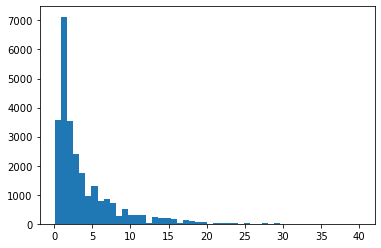

In [55]:
plt.hist(rentention_inter_count_df['ratio_yellow_pink'], bins=50)
plt.show()

进一步研究上述结论，可以进一步加强上述结论

In [56]:
yellow_larger_pink = rentention_inter_count_df[rentention_inter_count_df['Transaction ID_x'] < rentention_inter_count_df['Transaction ID_y']].__len__() / rentention_inter_count_df.__len__()
yellow_larger_pink

0.669683257918552

In [57]:
yellow_larger_equal_pink = rentention_inter_count_df[rentention_inter_count_df['Transaction ID_x'] <= rentention_inter_count_df['Transaction ID_y']].__len__() / rentention_inter_count_df.__len__()
yellow_larger_equal_pink

0.8606871692614464

67% of the common users, more often take the Yellow Cab, 86% of the users, the number of times they take Yellow Cab is greater than or equal to the Pink Cab.

可以看出，67%的共同用户，更多乘坐yellow cab；86%的用户，乘坐yellow cab的次数大于等于pink cab

In [58]:
rentention_count_df = all_df.groupby(['Company', 'Customer ID']).count()
rentention_count_df

Transaction ID  Payment_Mode  Gender  Age  \
Company    Customer ID                                              
Pink Cab   1                         4             4       4    4   
           2                         4             4       4    4   
           3                         6             6       6    6   
           4                         1             1       1    1   
           5                         8             8       8    8   
...                                ...           ...     ...  ...   
Yellow Cab 59996                     4             4       4    4   
           59997                     8             8       8    8   
           59998                     6             6       6    6   
           59999                     6             6       6    6   
           60000                    14            14      14   14   

                        Income (USD/Month)  City  KM Travelled  Price Charged  \
Company    Customer ID                                                          
Pink Cab   1                             4     4             4              4   
           2                             4     4             4              4   
           3                             6     6             6              6   
           4                             1     1             1              1   
           5                             8     8             8              8   
...                                    ...   ...           ...            ...   
Yellow Cab 59996                         4     4             4              4   
           59997                         8     8             8              8   
           59998                         6     6             6              6   
           59999                         6     6             6              6   
           60000                        14    14            14             14   

                        Cost of Trip  Population  Users  Date  ave_profit_km  \
Company    Customer ID                                                         
Pink Cab   1                       4           4      4     4              4   
           2                       4           4      4     4              4   
           3                       6           6      6     6              6   
           4                       1           1      1     1              1   
           5                       8           8      8     8              8   
...                              ...         ...    ...   ...            ...   
Yellow Cab 59996                   4           4      4     4              4   
           59997                   8           8      8     8              8   
           59998                   6           6      6     6              6   
           59999                   6           6      6     6              6   
           60000                  14          14     14    14             14   

                        Year  Profit  Class  Age Group  
Company    Customer ID                                  
Pink Cab   1               4       4      4          4  
           2               4       4      4          4  
           3               6       6      6          6  
           4               1       1      1          1  
           5               8       8      8          8  
...                      ...     ...    ...        ...  
Yellow Cab 59996           4       4      4          4  
           59997           8       8      8          8  
           59998           6       6      6          6  
           59999           6       6      6          6  
           60000          14      14     14         14  

[72226 rows x 17 columns]

In [59]:
sum(rentention_count_df.loc['Pink Cab']['Transaction ID'] >= 5) / rentention_count_df.loc['Pink Cab'].__len__()

0.1705845963501392

In [60]:
sum(rentention_count_df.loc['Pink Cab']['Transaction ID'] >= 10) / rentention_count_df.loc['Pink Cab'].__len__()

0.015218063717909062

In [61]:
sum(rentention_count_df.loc['Yellow Cab']['Transaction ID'] >= 5) / rentention_count_df.loc['Yellow Cab'].__len__()

0.3955283737718067

In [62]:
sum(rentention_count_df.loc['Yellow Cab']['Transaction ID'] >= 10) / rentention_count_df.loc['Yellow Cab'].__len__()

0.26857329055544416

It can be seen that 17% of users use pink cab 5 times or more, while 40% use yellow cab. 1.5% of customers use pink cab 10 times or more, while 27% use yellow cab, indicating that yellow cab has better user retention.

可以看出，pink cab使用5次及以上的用户占17%，而yellow cab占40%，pink cab使用10次以上的客户占1.5%，而yellow cab占27%，说明yellow cab的用户留存更好。